# Setup

In [1]:
!pip install -q lightning

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.5/869.5 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 25.7 MB/s eta 0:00:00


# ENV

In [2]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader

import numpy as np
import pandas as pd
import lightning as L
from tqdm.auto import tqdm

from einops.layers.torch import Reduce, Rearrange
from einops import reduce, rearrange, repeat, einsum, parse_shape, pack, unpack

In [3]:
import seaborn as sns
sns.set()

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams['lines.linewidth']=2

import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg', 'pdf')

In [4]:
L.seed_everything(42)

torch.backends.cudnn.deterministic=True
torch.backends.cudnn.benchmark=False

torch.autograd.set_detect_anomaly(True)

device='cuda' if torch.cuda.is_available() else 'cpu'
device

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42


'cpu'

# DATA

In [5]:
import urllib.request

content_url = 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg'
content_path = 'content.jpg'

style_url = 'https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg'
style_path = 'style.jpg'

urllib.request.urlretrieve(content_url, content_path)
urllib.request.urlretrieve(style_url, style_path)

('style.jpg', <http.client.HTTPMessage at 0x7c62f9f3b130>)

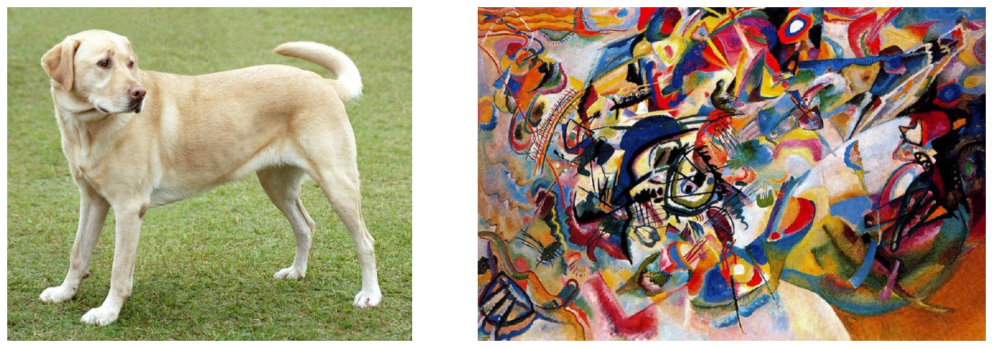

In [6]:
from PIL import Image

fig, axes = plt.subplots(1,2,figsize=[15,5])
content_image=Image.open('content.jpg')
axes[0].imshow(content_image)
axes[0].axis('off')

style_image=Image.open('style.jpg')
axes[1].imshow(style_image)
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Model

In [7]:
content_layers = [30]
style_layers = [0,5,10,19,28]

In [8]:
def gram_matrix(input_tensor):
  result = einsum(input_tensor,input_tensor,'b c h w , b C h w -> b c C')
  input_shape = input_tensor.shape
  num_locations = input_shape[1]*input_shape[2]
  return result/num_locations

x=torch.rand(7,512,32,32)
gram_matrix(x).shape

torch.Size([7, 512, 512])

In [9]:
from torchvision import transforms
from torchvision.models import vgg19, VGG19_Weights

class StyleContentModel(nn.Module):
    def __init__(self, style_layers, content_layers):
        super().__init__()
        self.vgg = vgg19(weights=VGG19_Weights.IMAGENET1K_V1).features.eval()
        self.style_layers=style_layers
        self.content_layers=content_layers
        for param in self.vgg.parameters():
            param.requires_grad = False
        self.preprocess = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
            Rearrange('c h w -> 1 c h w')
        ])

    def forward(self, x):
        x=self.preprocess(x)
        style_outputs=[]
        content_outputs=[]
        for idx,layer in enumerate(self.vgg):
            x=layer(x)
            if idx in self.style_layers:
                style_outputs.append(x)
            elif idx in self.content_layers:
                content_outputs.append(x)

        style_outputs = [gram_matrix(style_output)for style_output in style_outputs]

        content_dict = {id: value for id, value in zip(self.content_layers, content_outputs)}

        style_dict = {id: value for id, value in zip(self.style_layers, style_outputs)}

        return {'content': content_dict, 'style': style_dict}

x=torch.rand(3,32,32)
tmp=StyleContentModel(style_layers, content_layers)
tmp(x).keys()

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:12<00:00, 47.0MB/s]


dict_keys(['content', 'style'])

# Training

In [10]:
style_tensor=transforms.ToTensor()(style_image)
content_tensor=transforms.ToTensor()(content_image)

extractor=StyleContentModel(style_layers,content_layers).to(device)

with torch.no_grad():
    style_targets = extractor(style_tensor.to(device))['style']
    content_targets = extractor(content_tensor.to(device))['content']

In [11]:
style_weight=1e-2
content_weight=1e4
image = nn.Parameter(transforms.ToTensor()(content_image)).to(device)
opt = torch.optim.Adam([image],lr=0.02, eps=1e-1)

In [12]:
def style_content_loss(outputs):
    style_outputs = outputs['style']
    content_outputs = outputs['content']

    style_loss = 0.0
    for id in style_layers:
        style_loss += torch.mean((style_outputs[id] - style_targets[id])**2)
    style_loss = (style_loss / len(style_layers)) * style_weight

    content_loss = 0.0
    for id in content_layers:
        content_loss += torch.mean((content_outputs[id] - content_targets[id])**2)
    content_loss = (content_loss / len(content_layers)) * content_weight

    loss = style_loss + content_loss
    return loss

  0%|          | 0/50 [00:00<?, ?it/s]

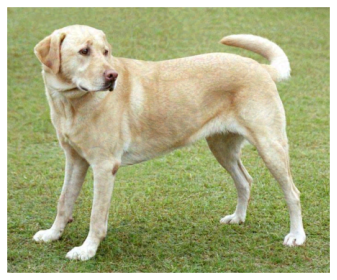

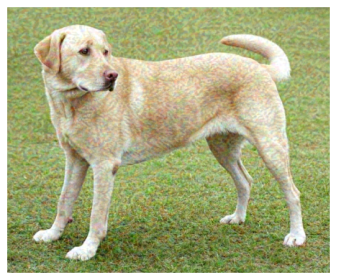

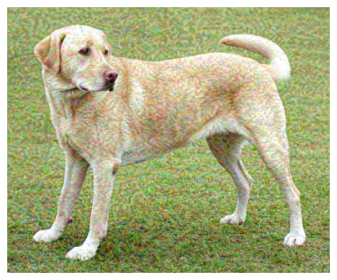

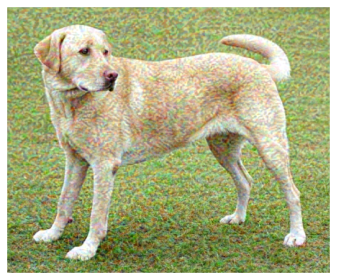

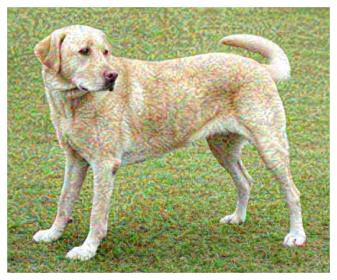

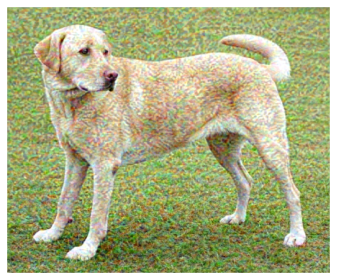

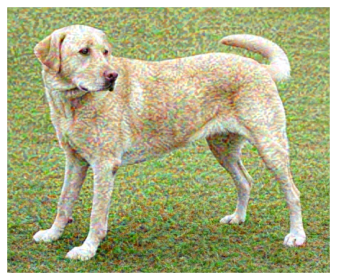

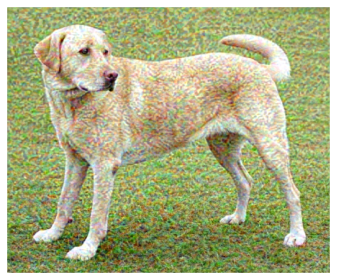

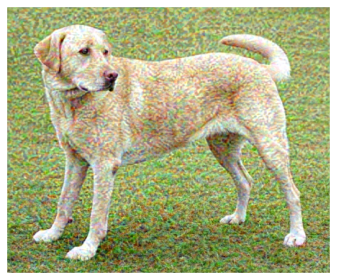

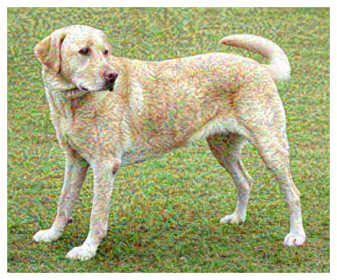

In [13]:
num_steps=50
p_bar=tqdm(range(num_steps))

for step in p_bar:
    outputs = extractor(image)
    loss = style_content_loss(outputs)
    opt.zero_grad()
    loss.backward()
    opt.step()
    image.data=torch.clamp(image, min=0.0, max=1.0)
    p_bar.set_postfix(loss=loss.item())
    if p_bar.n%5==4:
        plt.imshow(image.detach().cpu().permute(1,2,0))
        plt.axis('off')
        plt.show()

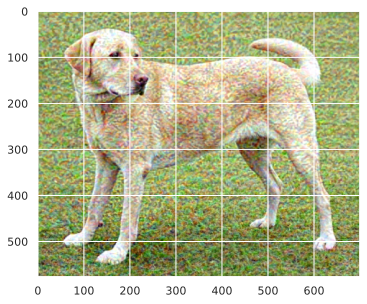

In [14]:
plt.imshow(image.detach().permute(1,2,0))